## Imports

In [46]:
import os
import sys
from collections import defaultdict
from itertools import combinations
from pathlib import Path
from typing import Dict, List, Literal, Optional, Tuple, Union

import IPython
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display

notebook_path = Path(IPython.extract_module_locals()[1]["__vsc_ipynb_file__"])
project_dir = notebook_path.parent.parent
sys.path.append(str(project_dir))
import src.utils.custom_log as custom_log
import src.utils.json_util as json_util
from src.utils.Csv import Csv
from src.utils.set_rcparams import set_rcparams

os.chdir(project_dir)
LOG = custom_log.init_logger(__name__)
custom_log.set_level(custom_log.LEVELS.DEBUG)
LOG.info("Log initialized")

2024-02-12 17:46:58,281 MainProcess - MainThread DEBUG Logger __main__ initialized || custom_log.py
2024-02-12 17:46:58,285 MainProcess - MainThread INFO Log initialized || 1543876800.py


In [29]:
set_rcparams()
PIC_DIR = Path("reports/figures/DOE") / notebook_path.stem
PIC_DIR.mkdir(parents=True, exist_ok=True)
PAGE_WIDTH = 448.13095 / 72

2024-02-12 17:29:22,100 MainProcess - MainThread DEBUG Installed font ['TeX Gyre Adventor', 'TeX Gyre Bonum', 'TeX Gyre Chorus', 'TeX Gyre Cursor', 'TeX Gyre Heros', 'TeX Gyre Heros Cn', 'TeX Gyre Pagella', 'TeX Gyre Schola', 'TeX Gyre Termes'] || set_rcparams.py
2024-02-12 17:29:22,105 MainProcess - MainThread DEBUG Using style src\visualization\dissertation.mplstyle || set_rcparams.py


## Load Data

In [58]:
DOE_DIR = Path(r"Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140")

In [3]:
para:dict = json_util.load(f_path=project_dir / "data" / "used_data")
LOG.info("Following parameters available: %s", para.keys())

2024-02-12 17:11:29,396 MainProcess - MainThread DEBUG Load c:\Users\plaschkies\Documents\Py_Projects\aihiii\data\used_data.json || json_util.py
2024-02-12 17:11:29,409 MainProcess - MainThread INFO Following parameters available: dict_keys(['_raw_data_dir', '_doe_fname', '_doe_metadata_fname']) || 4182648466.py


In [4]:
_raw_data_dir: Path = project_dir / para["_raw_data_dir"]
if _raw_data_dir.is_dir():
    LOG.debug("Data is in %s", _raw_data_dir)
else:
    LOG.critical("Directory not found %s", _raw_data_dir)

2024-02-12 17:11:29,490 MainProcess - MainThread DEBUG Data is in c:\Users\plaschkies\Documents\Py_Projects\aihiii\data\raw\doe_big_grid_20230922_154140 || 3158667194.py


In [5]:
doe_metadata: dict = json_util.load(f_path=_raw_data_dir / para["_doe_metadata_fname"])
LOG.info("Loaded following keys from metadata: %s", doe_metadata.keys())

2024-02-12 17:11:30,439 MainProcess - MainThread DEBUG Load c:\Users\plaschkies\Documents\Py_Projects\aihiii\data\raw\doe_big_grid_20230922_154140\doe_info.json || json_util.py
2024-02-12 17:11:30,458 MainProcess - MainThread INFO Loaded following keys from metadata: dict_keys(['_date', '_doe_dir', '_doe_xlsx', '_n_simulations', '_dummy_position', '_dummy_type', '_tend_ms', '_sampling_rate_ms', '_unit_system_in', '_end_time_bigger_than']) || 2393102645.py


In [37]:
DOE = pd.read_excel(project_dir /Path(para["_raw_data_dir"]) / para["_doe_fname"], index_col=0)
DOE = DOE[DOE["V_Init"].eq(-15560)].copy()
DOE.drop(columns=["V_Init"], inplace=True)
DOE

,PAB_M_Scal,PAB_Vent_T,Pulse_Angle,Pulse_X_Scale,SLL,PERC
2,0.9,0.07,-10,0.8,2140,5
7,0.9,0.07,-10,0.8,2240,5
12,0.9,0.07,-10,0.8,2340,5
17,0.9,0.07,-10,0.8,2440,5
22,0.9,0.07,-10,0.8,2540,5
...,...,...,...,...,...,...
46852,1.1,0.13,10,1.2,2140,95
46857,1.1,0.13,10,1.2,2240,95
46862,1.1,0.13,10,1.2,2340,95
46867,1.1,0.13,10,1.2,2440,95


In [38]:
DOE.describe()

,PAB_M_Scal,PAB_Vent_T,Pulse_Angle,Pulse_X_Scale,SLL,PERC
count,9375.000000,9375.000000,9375.000000,9375.000000,9375.000000,9375.000000
mean,1.000000,0.100000,0.000000,1.000000,2340.000000,50.000000
std,0.070714,0.021214,7.071445,0.141429,141.428899,36.744306
min,0.900000,0.070000,-10.000000,0.800000,2140.000000,5.000000
25%,0.950000,0.085000,-5.000000,0.900000,2240.000000,5.000000
50%,1.000000,0.100000,0.000000,1.000000,2340.000000,50.000000
75%,1.050000,0.115000,5.000000,1.100000,2440.000000,95.000000
max,1.100000,0.130000,10.000000,1.200000,2540.000000,95.000000


In [8]:
END_TIMES = {}
for sim_id in DOE.index:
    sim_info_path = DOE_DIR / f"V{sim_id:07d}" / "sim_info.json"
    sim_info = json_util.load(sim_info_path)
    END_TIMES[sim_id] = sim_info["_input_end_time"]

END_TIMES = pd.Series(END_TIMES)
END_TIMES

2024-02-12 17:11:35,083 MainProcess - MainThread DEBUG Load Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000002\sim_info.json || json_util.py
2024-02-12 17:11:35,094 MainProcess - MainThread DEBUG Load Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000007\sim_info.json || json_util.py
2024-02-12 17:11:35,104 MainProcess - MainThread DEBUG Load Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000012\sim_info.json || json_util.py
2024-02-12 17:11:35,114 MainProcess - MainThread DEBUG Load Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000017\sim_info.json || json_util.py
2024-02-12 17:11:35,124 MainProcess - MainThread DEBUG Load Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000022\sim_info.json || json_util.py
2024-02-12 17:11:35,134 MainProcess - MainThr

2        139.901757
7        139.901757
12       139.901757
17       139.901757
22       139.901757
            ...    
46852    139.901755
46857    139.901355
46862    139.901726
46867    139.901333
46872    139.901533
Length: 9375, dtype: float64

## Analyze

c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

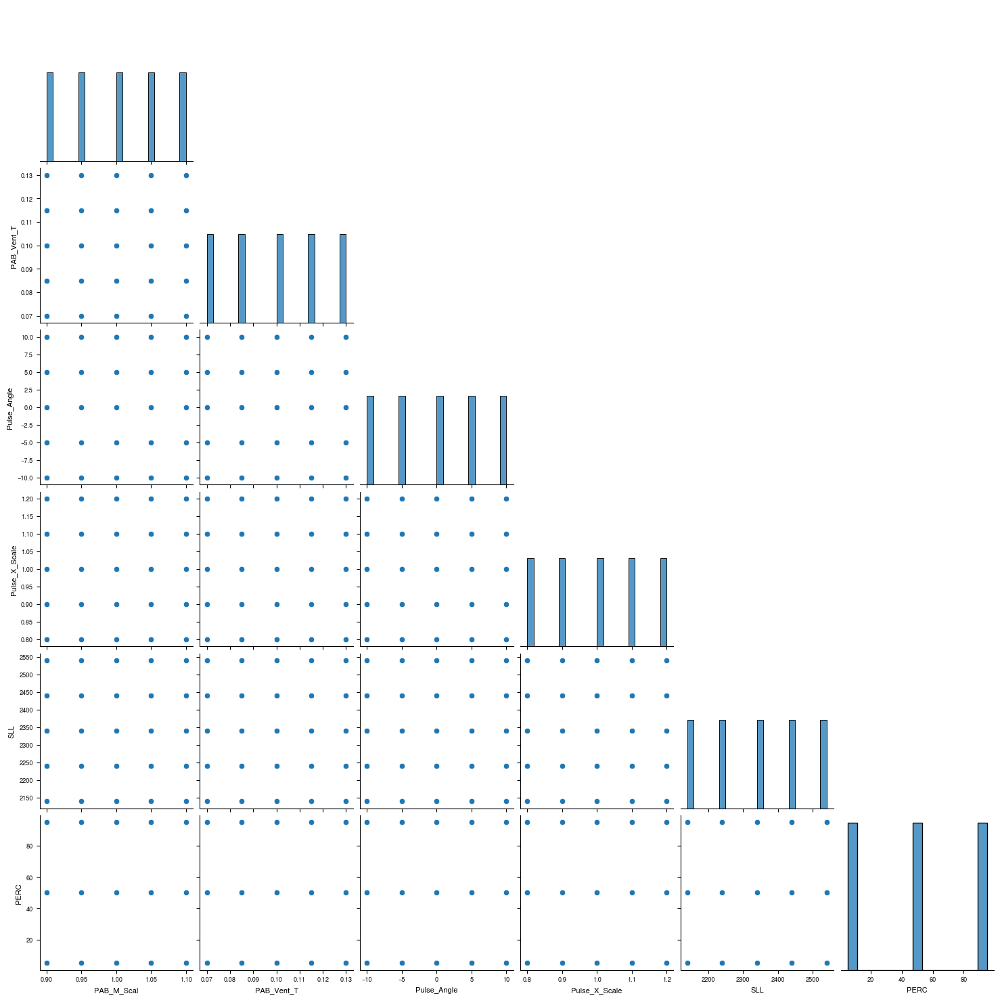

In [40]:
sns.pairplot(DOE, corner=True)

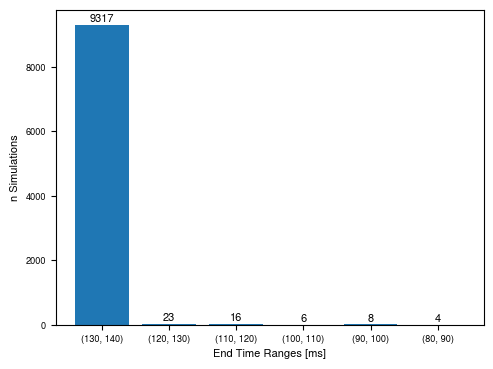

In [36]:
def plot_sim_endtimes():
    x_label = f"Percentage of Expected Run Time ({doe_metadata['_tend_ms']}ms)"
    y_label = "n Simulations"

    times = [(i,i+10) for i in range(80, 140,10)]
    in_bins = [END_TIMES.between(*t).sum() for t in times]

    fig, ax = plt.subplots(figsize=(0.8*PAGE_WIDTH, 0.6*PAGE_WIDTH))

    #plot
    bars = ax.bar(range(len(times)), in_bins)

    # annotate
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 1),
        textcoords="offset points", ha='center', va='bottom')

    # format
    ax.set_xlabel("End Time Ranges [ms]")
    ax.set_ylabel("n Simulations")
    ax.set_xticks(range(0,len(times)))
    ax.set_xticklabels(times)
    ax.invert_xaxis()

    for suffix in ("png", "pdf"):
        fig.savefig(PIC_DIR / f"sim_endtimes.{suffix}")


plot_sim_endtimes()

,PAB_M_Scal,PAB_Vent_T,Pulse_Angle,Pulse_X_Scale,SLL,PERC
min,0.9,0.07,-10.0,0.8,2140.0,5.0
max,1.1,0.13,10.0,1.2,2540.0,95.0


[ 5 95]
####################################################################################################


c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

####################################################################################################


c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

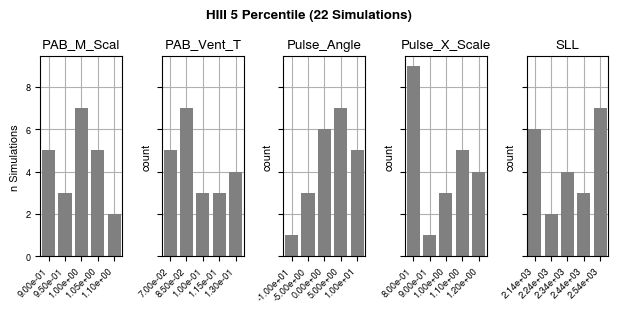

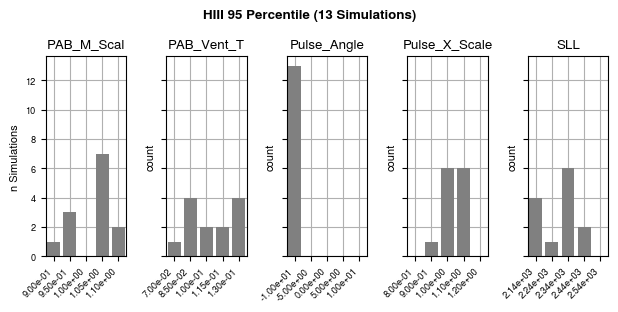

In [45]:
def filter_nio_in_doe():
    samples_nio = DOE.loc[END_TIMES[END_TIMES.le(120)].index]

    display(DOE.describe().loc[["min", "max"]])
    print(samples_nio["PERC"].unique())

    for perc in samples_nio["PERC"].unique():
        print("#" * 100)
        filt_perc = samples_nio[samples_nio["PERC"].eq(perc)]

        filt_perc_2 = filt_perc.drop(columns="PERC")

        fig, ax = plt.subplots(
            ncols=filt_perc_2.shape[1], figsize=(PAGE_WIDTH, 0.5*PAGE_WIDTH), sharey="all"
        )
        for i, para in enumerate(filt_perc_2.columns):
            sns.countplot(
                x=[f"{x:.2e}" for x in filt_perc_2[para]],
                ax=ax[i],
                order=[f"{x:.2e}" for x in sorted(DOE[para].unique())],
                color="gray"
            )
            ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=45, ha="right")
            ax[i].set_title(para)
            ax[i].grid()
            ax[i].set_axisbelow(True)
        ax[0].set_ylabel("n Simulations")
        fig.suptitle(f"HIII {perc} Percentile ({filt_perc.shape[0]} Simulations)")
        fig.tight_layout()
        for suffix in ("png", "pdf"):
            fig.savefig(PIC_DIR / f"sim_endtimes_{perc}.{suffix}")


filter_nio_in_doe()

c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

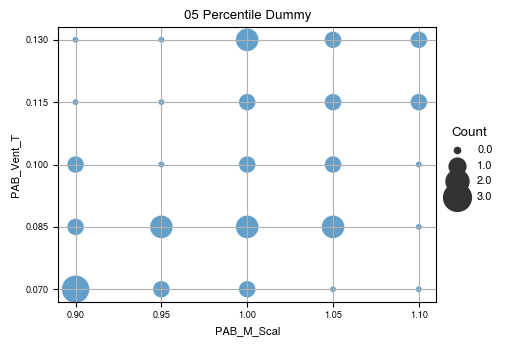

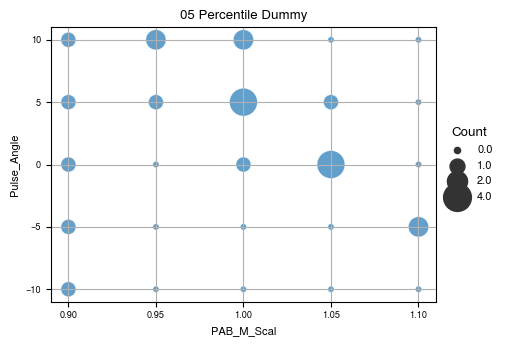

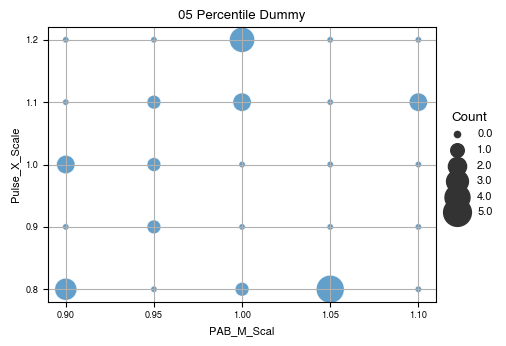

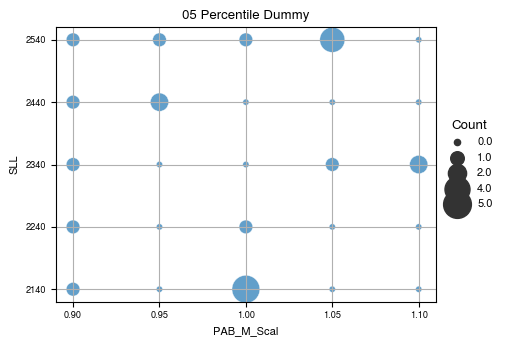

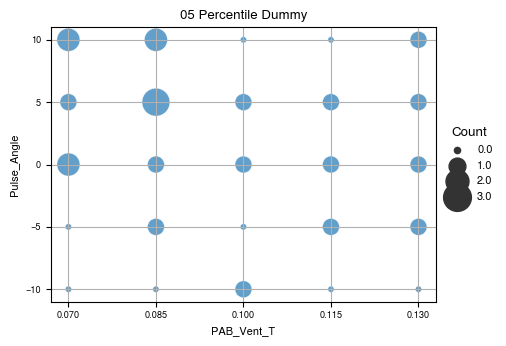

...

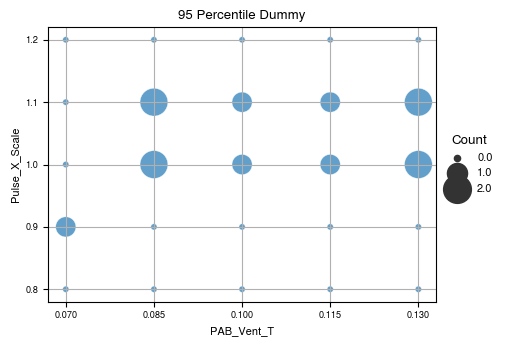

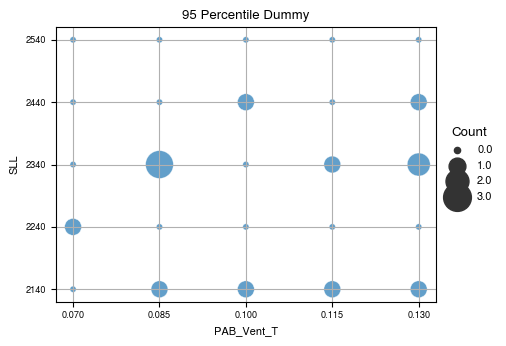

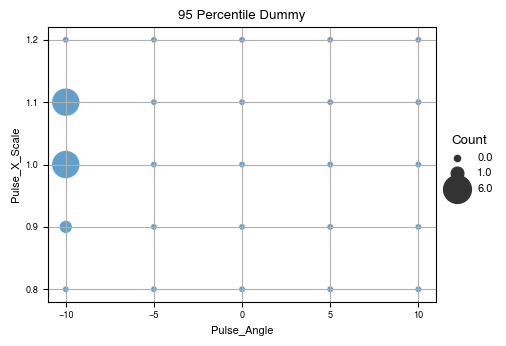

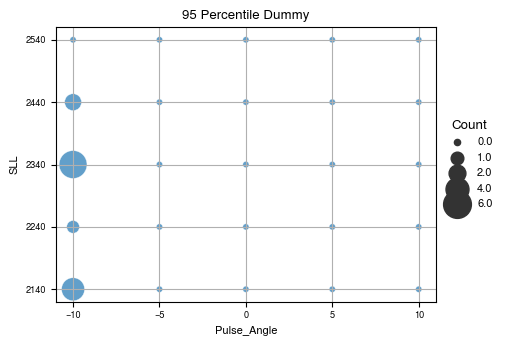

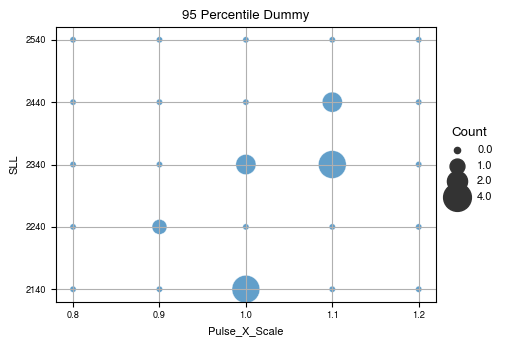

In [47]:
def bubbles(
    col_a: str, col_b: str, perc: int, cnt_name: str = "Count", perc_name: str = "PERC"
):
    samples_nio = DOE.loc[END_TIMES[END_TIMES.le(120)].index]

    filt: pd.DataFrame = samples_nio[samples_nio[perc_name].eq(perc)].copy()
    filt.drop(columns=perc_name, inplace=True)
    filt = filt.map(lambda x: f"{x:.2e}")
    filt[cnt_name] = [1] * filt.shape[0]

    # count
    counter = defaultdict(list)
    for val_a in DOE[col_a].unique():
        val_a = f"{val_a:.2e}"
        for val_b in DOE[col_b].unique():
            val_b = f"{val_b:.2e}"
            counter[col_a].append(val_a)
            counter[col_b].append(val_b)
            counter[cnt_name].append(
                len(filt[filt[col_a].eq(val_a) & filt[col_b].eq(val_b)])
            )
    counter = pd.DataFrame(counter).map(lambda x: float(x))

    # plot
    fig, ax = plt.subplots(figsize=(4.5, 3.5))
    sns.scatterplot(
        data=counter, x=col_a, y=col_b, size=cnt_name, ax=ax, sizes=(20, 400), alpha=0.7
    )
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.set_xticks(DOE[col_a].unique())
    ax.set_yticks(DOE[col_b].unique())
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), title=cnt_name)
    ax.set_title(f"{perc:02d} Percentile Dummy")
    ax.grid()
    fig.tight_layout()


for perc in [5, 50, 95]:
    for a, b in combinations(DOE.drop(columns="PERC").columns, 2):
        bubbles(col_a=a, col_b=b, perc=perc)

In [50]:
def get_combined_drops():
    samples_nio = DOE.loc[END_TIMES[END_TIMES.le(120)].index]
    rel_cols = [
        "PAB_M_Scal",
        "PAB_Vent_T",
        "Pulse_Angle",
        "Pulse_X_Scale",
        "SLL",
    ]

    collector = defaultdict(list)
    for idx in samples_nio.index:
        collector[tuple(samples_nio.loc[idx, rel_cols])].append(
            samples_nio.loc[idx, "PERC"]
        )
    collector = dict(collector)

    for key in collector:
        if len(collector[key]) > 1:
            print(dict(zip(rel_cols, key)), collector[key]) 


get_combined_drops()

In [56]:
def filter_nio_in_doe() -> list:
    samples_nio = DOE.loc[END_TIMES[END_TIMES.le(120)].index]
    env_para = [
        "PAB_M_Scal",
        "PAB_Vent_T",
        "Pulse_Angle",
        "Pulse_X_Scale",
        "SLL",
    ]

    doe_idx = DOE.copy()
    doe_idx["ID"] = DOE.index
    doe_idx = doe_idx.set_index(env_para)
    doe_idx.sort_index(inplace=True)
    env_para = doe_idx.index.names

    to_drop = []
    for idx in samples_nio.index:
        filt = doe_idx.loc[tuple(samples_nio.loc[idx, env_para].to_list())]
        to_drop.extend(filt["ID"])
        # display(doe_idx.loc[tuple(samples_nio.loc[idx, env_para].to_list())])
        # break

    to_drop = sorted(set(to_drop))
    LOG.info("Found %s simulations to drop.", len(to_drop))

    return to_drop


DROP_IDS = filter_nio_in_doe()

2024-02-12 17:57:55,348 MainProcess - MainThread INFO Found 105 simulations to drop. || 1170217439.py


2024-02-12 17:49:11,368 MainProcess - MainThread INFO Shape before drop (9375, 6) vs shape after (9270, 6) || 2177587740.py
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plasch

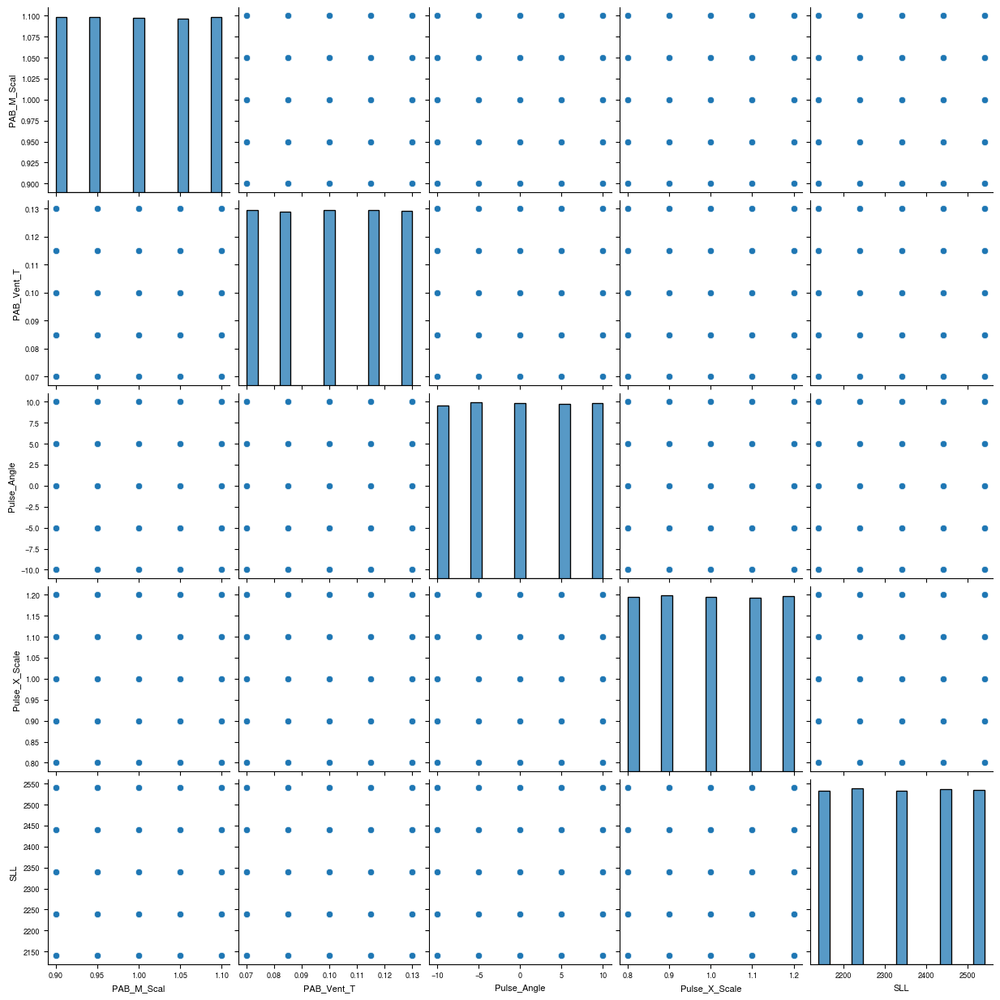

In [53]:
def parameter_with_drops():
    doe_short = DOE.drop(index=DROP_IDS)
    LOG.info("Shape before drop %s vs shape after %s", DOE.shape, doe_short.shape)

    f1 = doe_short[doe_short["PERC"].eq(5)]
    f1 = f1.drop(columns="PERC")

    g = sns.pairplot(f1)


parameter_with_drops()

2024-02-12 17:49:18,127 MainProcess - MainThread INFO Shape before drop (9375, 6) vs shape after (105, 6) || 1196446309.py
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschk

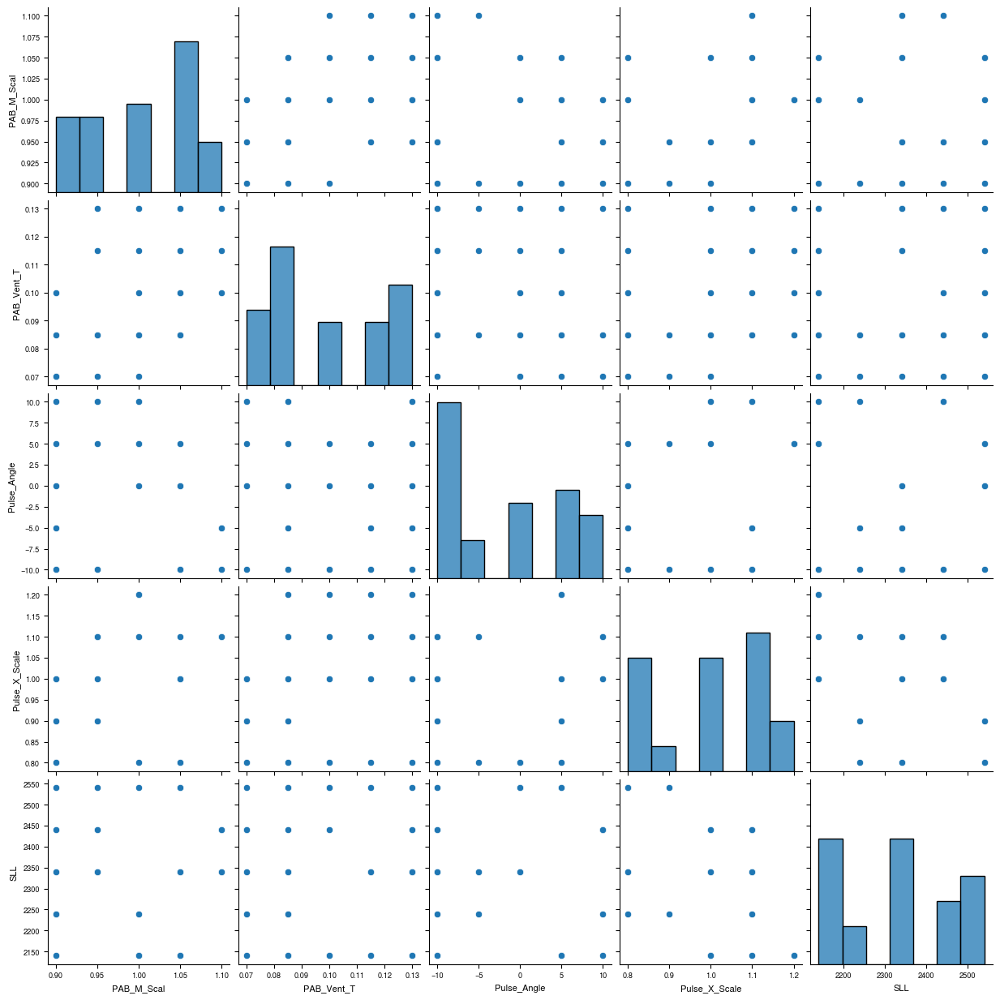

In [54]:
def parameter_with_drops_inv():
    doe_short = DOE.loc[DROP_IDS]
    LOG.info("Shape before drop %s vs shape after %s", DOE.shape, doe_short.shape)

    f1 = doe_short[doe_short["PERC"].eq(5)]
    f1 = f1.drop(columns="PERC")

    g = sns.pairplot(f1)


parameter_with_drops_inv()

In [59]:
def get_data(cfc: Literal["A", "B", "C", "D", "X"]) -> pd.DataFrame:
    doe_short = DOE.drop(index=DROP_IDS)
    case_injs = []
    for sim_id in doe_short.index:
        inj_data = DOE_DIR / f"V{sim_id:07d}" / "injury_criteria.csv.zip"
        db = Csv(csv_path=inj_data, compress=True).read()
        vals = db.loc[cfc]
        vals.name = sim_id
        case_injs.append(vals)

    db = pd.concat(case_injs, axis=1).T
    db.index.name = "SID"
    db.rename(columns={"Chest_Deflection": "Chest_Defl.", "Femur_Fz_Max": "Femur_Fz"}, inplace=True)

    return db


DB_INJ: pd.DataFrame = get_data(cfc="D")

DB_INJ

2024-02-12 17:58:33,406 MainProcess - MainThread DEBUG CSV file without suffix is Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000002\injury_criteria, Compress True || Csv.py
2024-02-12 17:58:33,406 MainProcess - MainThread DEBUG CSV file is Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000002\injury_criteria.csv.zip || Csv.py
2024-02-12 17:58:33,407 MainProcess - MainThread INFO Read Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000002\injury_criteria.csv.zip || Csv.py
2024-02-12 17:58:33,424 MainProcess - MainThread DEBUG CSV file without suffix is Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_154140\V0000007\injury_criteria, Compress True || Csv.py
2024-02-12 17:58:33,424 MainProcess - MainThread DEBUG CSV file is Q:\Honda_Accord_2014_Sled_with_HIII_Rigid_Seat_SpeedOpt_BigDOE\doe_big_grid_20230922_1541

,Head_HIC15,Head_HIC36,Head_a3ms,Neck_Nij,Neck_Fz_Max_Compression,Neck_Fz_Max_Tension,Neck_My_Max,Neck_Fx_Shear_Max,Chest_Defl.,Chest_a3ms,Femur_Fz
SID,,,,,,,,,,,
2,111.953,212.221,41.288,0.577,0.004,1.287,42.923,0.876,21.219,45.886,1.725
7,143.363,235.603,41.034,0.620,0.004,1.298,49.124,0.874,18.033,46.575,1.741
12,174.194,313.600,48.128,0.665,0.004,1.429,51.409,1.354,12.134,48.418,1.732
17,137.654,271.279,40.207,0.585,0.004,1.258,45.214,1.327,12.547,48.562,1.673
22,163.013,339.917,50.782,0.827,0.004,2.171,49.666,1.170,17.950,47.811,1.714
...,...,...,...,...,...,...,...,...,...,...,...
46852,412.166,570.121,61.719,0.433,0.100,2.416,57.662,1.384,79.222,53.581,8.066
46857,410.183,598.690,63.217,0.365,0.279,1.779,61.612,1.496,76.591,53.610,8.095
46862,387.403,562.964,62.583,0.360,0.000,1.712,62.936,1.461,74.410,56.540,8.991


c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\plaschkies\Documents\Py_Projects\aihiii\.conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Temp\ipykernel_12120\596933421.py:23: UserWarning: Glyph 8201 (\N{THIN SPACE}) missing from current font.
  fig.savefig(PIC_DIR / f"inj_

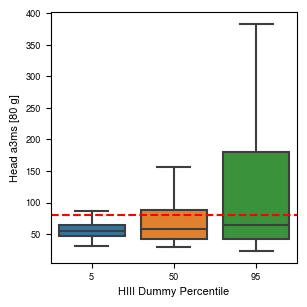

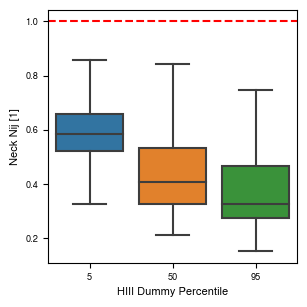

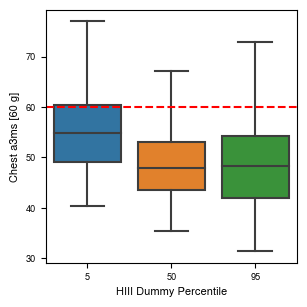

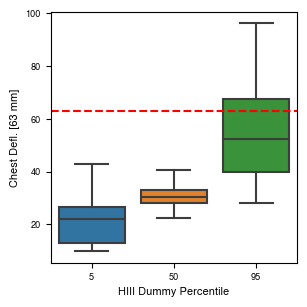

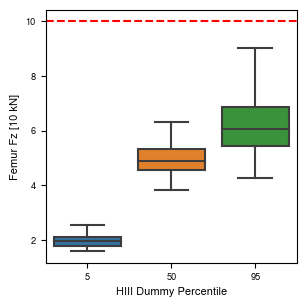

In [68]:
LIMS = {
        "Head_a3ms": [80, "g"],
        "Neck_Nij": [1, ""],
        "Chest_a3ms": [60, "g"],
        "Chest_Defl.": [63, "mm"],
        "Femur_Fz": [10, "kN"],
    }

def inj_plots():
    doe_short = DOE.drop(index=DROP_IDS)
    inj = DB_INJ.copy()
    inj = inj.join(doe_short["PERC"])

    for col in LIMS.keys():
        fig, ax = plt.subplots(figsize=(0.5*PAGE_WIDTH, 0.5*PAGE_WIDTH))
        sns.boxplot(data=inj, x="PERC", y=col, ax=ax, showfliers = False)
        ax.axhline(LIMS[col][0], color="r", linestyle="--")
        unit = str(LIMS[col][0]) + (("\u2009" + LIMS[col][1]) if LIMS[col][1] else "")
        ax.set_ylabel(f"{col.replace('_', ' ')} [{unit}]")
        ax.set_xlabel("HIII Dummy Percentile")

        for suffix in ("png", "pdf"):
            fig.savefig(PIC_DIR / f"inj_{col}.{suffix}")
        

inj_plots()